<div align='center'>
<img src='https://www.funcionpublica.gov.co/documents/d/guest/logo-universidad-nacional' width='520'/>

---
**Universidad Nacional de Colombia — Sede Manizales**  
Facultad de Ingeniería y Arquitectura  
Departamento de Ingeniería Eléctrica, Electrónica y Computación  
*Tópicos Avanzados de Visión Artificial*

**Profesor:** Juan Bernado Gomez  
**Autores:** Juan Camilo Giraldo Jiménez `1055750098`

</div>

Para realizar el laboratorio lo hemos dividido en 4 etapas:

* **ETAPA 1: CALIBRACIÓN MONOCULAR Y ESTÉREO (ALGORITMO DE ZHANG)**
* **ETAPA 2: RECTIFICACIÓN ESTÉREO Y VERIFICACIÓN EPIPOLAR**

Las otras dos etapas seran divididas en dos metodos, uno clasico y uno mas moderno que utiliza Deep Learning:

* **ETAPA 3: MAPAS DE DISPARIDAD (Metodo clasico: StereoSGBM - Metodo con DeepLearning: RAFT_Stereo)**
* **ETAPA 4: RECONSTRUCCIÓN ESTÉREO (Metodo clasico: StereoSGBM - Metodo con DeepLearning: RAFT-Stereo)**

## **ETAPA 1: CALIBRACIÓN MONOCULAR Y ESTÉREO (ALGORITMO DE ZHANG)**

Para llevar a cabo la calibración se capturaron pares de fotografías (10 pares en total) a un patrón plano de dimensiones conocidas (tablero de ajedrez).

El **Algoritmo de Zhang** permite determinar cómo la cámara proyecta el mundo tridimensional sobre un plano 2D y corregir la distorsión del lente. Matemáticamente, el modelo de cámara estenopeica (*pinhole*) se define como:

$$s \begin{bmatrix} u \\ v \\ 1 \end{bmatrix} = K \begin{bmatrix} R & T \end{bmatrix} \begin{bmatrix} X \\ Y \\ Z \\ 1 \end{bmatrix}, \quad K = \begin{bmatrix} f_x & 0 & c_x \\ 0 & f_y & c_y \\ 0 & 0 & 1 \end{bmatrix}$$

Donde:
* $(X, Y, Z, 1)^T$: Coordenadas homogéneas del punto en el mundo 3D.
* $(u, v, 1)^T$: Coordenadas en píxeles de la imagen 2D.
* $s$: Factor de escala.
* $K$: Matriz de parámetros intrínsecos ($f_x, f_y$ como distancias focales en píxeles y $c_x, c_y$ como el centro óptico).
* $[R \mid T]$: Matriz de parámetros extrínsecos (Rotación $R$ y Traslación $T$).

---

### Pasos del Algoritmo de Zhang:

**1. Cálculo de la Homografía ($H$) por imagen**
Asumiendo que el patrón de calibración se encuentra en el plano $Z = 0$, las coordenadas reales se simplifican a $(X, Y, 0)$. Se relaciona la posición del mundo real con la proyección en píxeles mediante una matriz de transformación plana $H$ de $3 \times 3$:

$$H = K \begin{bmatrix} \mathbf{r}_1 & \mathbf{r}_2 & \mathbf{t} \end{bmatrix}$$

* `cv2.findChessboardCorners()`: Localiza las intersecciones internas del patrón.
* `cv2.cornerSubPix()`: Refina la posición de las esquinas con precisión subpíxel.

**2. Obtención de la Matriz Intrínseca ($K$)**
Aprovechando que los vectores de rotación son ortonormales ($\mathbf{r}_1^T \mathbf{r}_2 = 0$ y $\|\mathbf{r}_1\| = \|\mathbf{r}_2\| = 1$), cada imagen aporta dos restricciones geométricas puras sobre los intrínsecos:

$$\mathbf{h}_1^T K^{-T} K^{-1} \mathbf{h}_2 = 0$$
$$\mathbf{h}_1^T K^{-T} K^{-1} \mathbf{h}_1 = \mathbf{h}_2^T K^{-T} K^{-1} \mathbf{h}_2$$

Al resolver este sistema lineal con múltiples tomas, se despeja la matriz de parámetros internos $K$.
* `cv2.calibrateCamera()`: Estima analíticamente la matriz $K$.

**3. Estimación de Parámetros Extrínsecos ($R, T$)**
Con $K$ conocida, se extraen las dos primeras columnas de la rotación y el vector de traslación mediante $K^{-1}H$:

$$\mathbf{r}_1 = \lambda K^{-1} \mathbf{h}_1, \quad \mathbf{r}_2 = \lambda K^{-1} \mathbf{h}_2, \quad \mathbf{t} = \lambda K^{-1} \mathbf{h}_3$$

El tercer vector de rotación se obtiene mediante el producto cruz de las dos primeras columnas: $\mathbf{r}_3 = \mathbf{r}_1 \times \mathbf{r}_2$.

**4. Estimación de Coeficientes de Distorsión**
Dado que las aberraciones ópticas no son lineales, se modela la distorsión radial ($k_1, k_2, k_3$) y tangencial ($p_1, p_2$) refinando los parámetros iniciales mediante optimización no lineal, minimizando el error de reproyección.
* `cv2.calibrateCamera()`: Retorna el vector de distorsión `dist` conteniendo $[k_1, k_2, p_1, p_2, k_3]$.

**5. Calibración Estéreo Relativa**
Con ambas cámaras calibradas individualmente, se estima la transformación geométrica rígida que relaciona el marco de referencia de la cámara izquierda con la derecha ($R$ y $T$).
* `cv2.stereoCalibrate()`: Modela la relación espacial entre ambos sensores fijando los intrínsecos individuales mediante la bandera `CALIB_FIX_INTRINSIC`.

1. Conectando con Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

🚀 Iniciando proceso de calibración monocular y estéreo...
📦 Se encontraron 10 fotos izquierdas y 10 fotos derechas.

[PASO 3] Buscando esquinas 2D...
  🔍 Analizando par [1/10]: left_00.jpg / right_00.jpg


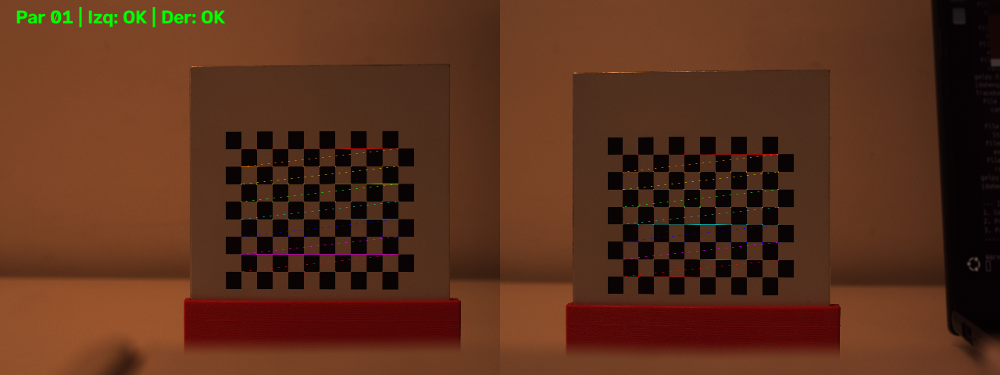

  🔍 Analizando par [2/10]: left_01.jpg / right_01.jpg


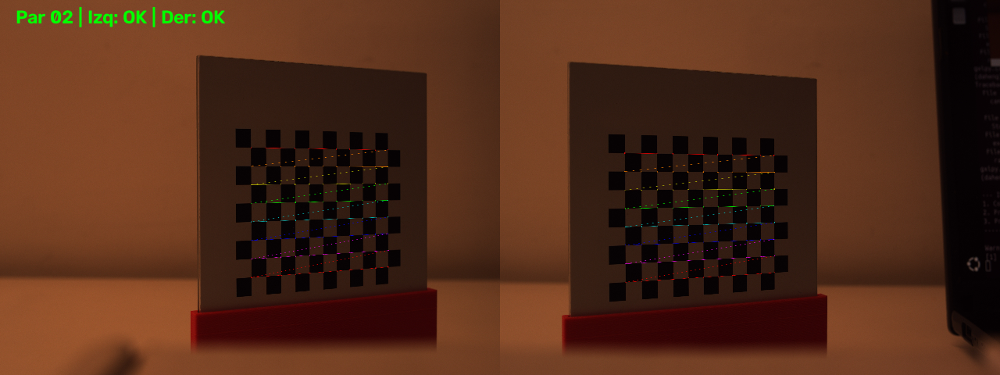

  🔍 Analizando par [3/10]: left_02.jpg / right_02.jpg
  🔍 Analizando par [4/10]: left_03.jpg / right_03.jpg
  🔍 Analizando par [5/10]: left_04.jpg / right_04.jpg
  🔍 Analizando par [6/10]: left_05.jpg / right_05.jpg
  🔍 Analizando par [7/10]: left_06.jpg / right_06.jpg
  🔍 Analizando par [8/10]: left_07.jpg / right_07.jpg
  🔍 Analizando par [9/10]: left_08.jpg / right_08.jpg
  🔍 Analizando par [10/10]: left_09.jpg / right_09.jpg

✅ Detección finalizada. Pares sincronizados válidos para Estéreo: 9/10

[PASO 4.1] Calculando Intrínsecos Cámara IZQUIERDA...
[PASO 4.2] Calculando Intrínsecos Cámara DERECHA...
[PASO 5] Calculando Parámetros EXTRÍNSECOS (Calibración Estéreo)...

[PASO FINAL] Guardando parámetros...
 💾 Parámetros guardados en:
 📂 /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/CalibracionCamara/Resultados

🎉 ¡Proceso finalizado con éxito!


In [1]:
#!/usr/bin/env python
import os
import glob
import cv2
import numpy as np
from google.colab import drive
from google.colab.patches import cv2_imshow

# ==============================================================================
# PASO 0: MONTAJE DE GOOGLE DRIVE
# ==============================================================================
print("1. Conectando con Google Drive...")
drive.mount('/content/drive')

# ==============================================================================
# CONFIGURACIÓN DE RUTAS ACTUALIZADAS
# ==============================================================================
BASE_DIR = "/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/CalibracionCamara"
LEFT_DIR = os.path.join(BASE_DIR, "Izquierda")
RIGHT_DIR = os.path.join(BASE_DIR, "Derecha")

# Carpetas de salida
INSPECTION_DIR = os.path.join(BASE_DIR, "inspeccion_deteccion")
RESULT_DIR = os.path.join(BASE_DIR, "Resultados")
os.makedirs(INSPECTION_DIR, exist_ok=True)
os.makedirs(RESULT_DIR, exist_ok=True)

# Parámetros del tablero
CHECKERBOARD = (11, 8)
SQUARE_SIZE = 6.0  # Tamaño del cuadrado en mm
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

print("\n🚀 Iniciando proceso de calibración monocular y estéreo...")

# ==============================================================================
# STEP 1: Generar coordenadas 3D del mundo real
# ==============================================================================
objp = np.zeros((CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
objp = objp * SQUARE_SIZE

# Listas individuales
objpoints_L, imgpoints_L = [], []
objpoints_R, imgpoints_R = [], []

# Listas sincronizadas exclusivas para Calibración Estéreo (Extrínsecos)
objpoints_stereo = []
imgpoints_L_stereo = []
imgpoints_R_stereo = []

# ==============================================================================
# STEP 2: Cargar imágenes desde carpetas Izquierda y Derecha
# ==============================================================================
left_images = sorted(glob.glob(os.path.join(LEFT_DIR, "*.jpg")) + glob.glob(os.path.join(LEFT_DIR, "*.png")))
right_images = sorted(glob.glob(os.path.join(RIGHT_DIR, "*.jpg")) + glob.glob(os.path.join(RIGHT_DIR, "*.png")))

total_images = len(left_images)
if total_images == 0 or len(right_images) == 0:
    raise RuntimeError(f"❌ Error: No se encontraron imágenes en:\n - {LEFT_DIR}\n - {RIGHT_DIR}")

print(f"📦 Se encontraron {len(left_images)} fotos izquierdas y {len(right_images)} fotos derechas.\n")

img_shape = None
flags = cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_NORMALIZE_IMAGE

# ==============================================================================
# STEP 3: Detección de esquinas
# ==============================================================================
print("[PASO 3] Buscando esquinas 2D...")

for i, (fname_L, fname_R) in enumerate(zip(left_images, right_images), 1):
    print(f"  🔍 Analizando par [{i}/{total_images}]: {os.path.basename(fname_L)} / {os.path.basename(fname_R)}")

    img_L = cv2.imread(fname_L)
    img_R = cv2.imread(fname_R)

    if img_L is None or img_R is None:
        print(f"     ⚠️ Advertencia: No se pudo cargar el par {i}.")
        continue

    gray_L = cv2.cvtColor(img_L, cv2.COLOR_BGR2GRAY)
    gray_R = cv2.cvtColor(img_R, cv2.COLOR_BGR2GRAY)

    if img_shape is None:
        img_shape = (gray_L.shape[1], gray_L.shape[0])

    ret_L, corners_L = cv2.findChessboardCorners(gray_L, CHECKERBOARD, flags)
    ret_R, corners_R = cv2.findChessboardCorners(gray_R, CHECKERBOARD, flags)

    # Procesar Cámara Izquierda
    if ret_L:
        corners_L2 = cv2.cornerSubPix(gray_L, corners_L, (11, 11), (-1, -1), criteria)
        objpoints_L.append(objp)
        imgpoints_L.append(corners_L2)
        cv2.drawChessboardCorners(img_L, CHECKERBOARD, corners_L2, ret_L)

    # Procesar Cámara Derecha
    if ret_R:
        corners_R2 = cv2.cornerSubPix(gray_R, corners_R, (11, 11), (-1, -1), criteria)
        objpoints_R.append(objp)
        imgpoints_R.append(corners_R2)
        cv2.drawChessboardCorners(img_R, CHECKERBOARD, corners_R2, ret_R)

    # Guardar par sincronizado solo si AMBAS tuvieron éxito (Para Extrínsecos)
    if ret_L and ret_R:
        objpoints_stereo.append(objp)
        imgpoints_L_stereo.append(corners_L2)
        imgpoints_R_stereo.append(corners_R2)

    # Vista previa
    preview_L = cv2.resize(img_L, (640, 480))
    preview_R = cv2.resize(img_R, (640, 480))
    combined_view = cv2.hconcat([preview_L, preview_R])

    status_text = f"Par {i:02d} | Izq: {'OK' if ret_L else 'FAIL'} | Der: {'OK' if ret_R else 'FAIL'}"
    color_text = (0, 255, 0) if (ret_L and ret_R) else (0, 0, 255)
    cv2.putText(combined_view, status_text, (20, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color_text, 2)
    cv2.imwrite(os.path.join(INSPECTION_DIR, f"resultado_par_{i:02d}.jpg"), combined_view)

    if i <= 2:
        cv2_imshow(combined_view)

print(f"\n✅ Detección finalizada. Pares sincronizados válidos para Estéreo: {len(objpoints_stereo)}/{total_images}\n")

# ==============================================================================
# STEP 4: Calibración Intrínsica Individual
# ==============================================================================
print("[PASO 4.1] Calculando Intrínsecos Cámara IZQUIERDA...")
ret_L, mtx_L, dist_L, rvecs_L, tvecs_L = cv2.calibrateCamera(objpoints_L, imgpoints_L, img_shape, None, None)

print("[PASO 4.2] Calculando Intrínsecos Cámara DERECHA...")
ret_R, mtx_R, dist_R, rvecs_R, tvecs_R = cv2.calibrateCamera(objpoints_R, imgpoints_R, img_shape, None, None)

# ==============================================================================
# STEP 5: Calibración Estéreo (Parámetros Extrínsecos: Rotación y Traslación)
# ==============================================================================
print("[PASO 5] Calculando Parámetros EXTRÍNSECOS (Calibración Estéreo)...")

flags_stereo = cv2.CALIB_FIX_INTRINSIC
ret_S, mtx_L, dist_L, mtx_R, dist_R, R, T, E, F = cv2.stereoCalibrate(
    objpoints_stereo,
    imgpoints_L_stereo,
    imgpoints_R_stereo,
    mtx_L, dist_L,
    mtx_R, dist_R,
    img_shape,
    criteria=criteria,
    flags=flags_stereo
)

# ==============================================================================
# GUARDAR RESULTADOS COMPLETOS (INTRÍNSECOS + EXTRÍNSECOS)
# ==============================================================================
print("\n[PASO FINAL] Guardando parámetros...")

npz_path = os.path.join(RESULT_DIR, "parametros_calibracion_completa.npz")
np.savez(
    npz_path,
    mtx_L=mtx_L, dist_L=dist_L, ret_L=ret_L,
    mtx_R=mtx_R, dist_R=dist_R, ret_R=ret_R,
    R=R, T=T, E=E, F=F, ret_S=ret_S,
    img_shape=img_shape
)

txt_path = os.path.join(RESULT_DIR, "parametros_calibracion_completa.txt")
with open(txt_path, "w") as f:
    f.write("==================================================\n")
    f.write("     PARÁMETROS DE CALIBRACIÓN (INTRÍNSECOS Y EXTRÍNSECOS)\n")
    f.write("==================================================\n\n")
    f.write(f"Resolución de Imagen: {img_shape[0]} x {img_shape[1]} px\n\n")

    f.write("--------------------------------------------------\n")
    f.write(" CÁMARA IZQUIERDA (INTRÍNSECOS)\n")
    f.write("--------------------------------------------------\n")
    f.write(f"RMS Error (px): {ret_L:.4f}\nMatriz K:\n")
    np.savetxt(f, mtx_L, fmt="%12.4f")
    f.write(f"\nDistorsión: {dist_L.ravel()}\n\n")

    f.write("--------------------------------------------------\n")
    f.write(" CÁMARA DERECHA (INTRÍNSECOS)\n")
    f.write("--------------------------------------------------\n")
    f.write(f"RMS Error (px): {ret_R:.4f}\nMatriz K:\n")
    np.savetxt(f, mtx_R, fmt="%12.4f")
    f.write(f"\nDistorsión: {dist_R.ravel()}\n\n")

    f.write("--------------------------------------------------\n")
    f.write(" PARÁMETROS EXTRÍNSECOS (CÁMARA DER RESPECTO A IZQ)\n")
    f.write("--------------------------------------------------\n")
    f.write(f"RMS Error Estéreo: {ret_S:.4f}\n\n")
    f.write("Matriz de Rotación (R):\n")
    np.savetxt(f, R, fmt="%12.6f")
    f.write("\nVector de Traslación T (mm/cm):\n")
    np.savetxt(f, T, fmt="%12.6f")

print(f" 💾 Parámetros guardados en:\n 📂 {RESULT_DIR}")
print("\n🎉 ¡Proceso finalizado con éxito!")

## **ETAPA 2: RECTIFICACIÓN ESTÉREO Y VERIFICACIÓN EPIPOLAR**
Previamente a esta etapa hacemos un par de fotos con tres objetos diferente, los cuales seran una pelota, una caja y un cubo rubik.

En esta etapa se procesan las fotos de los tres objetos utilizando los parámetros calculados en la calibración. El objetivo es corregir la deformación de los lentes y alinear digitalmente ambas cámaras para simplificar la búsqueda de coincidencias a una sola fila horizontal.

---

### Conceptos Clave:

* **Corrección de Distorsión:** Elimina las curvaturas provocadas por la óptica de las cámaras (efecto barril u ojo de pez) usando los coeficientes $k_1, k_2, p_1, p_2$, logrando que las líneas rectas del mundo real se mantengan rectas en la foto.
* **Rectificación Estéreo:** Transforma las imágenes para que ambas parezcan tomadas por dos cámaras perfectamente paralelas y alineadas a la misma altura. Esto hace que las **líneas epipolares** sean totalmente horizontales, reduciendo la búsqueda de coincidencias a un desplazamiento unicamente en el eje $X$ ($y_L = y_R$).
* **Matriz de Reproyección $Q$:** Es el producto directo del proceso de rectificación estéreo. Condensa la distancia focal ($f$), el centro óptico $(c_x, c_y)$ y la línea base ($b = \|T\|$) para convertir coordenadas de imagen y disparidad $(x, y, d)$ en coordenadas cartesianas 3D métricas reales $(X, Y, Z)$:

$$\begin{bmatrix} X \\ Y \\ Z \\ W \end{bmatrix} = Q \begin{bmatrix} x \\ y \\ d \\ 1 \end{bmatrix}, \quad Q = \begin{bmatrix} 1 & 0 & 0 & -c_x \\ 0 & 1 & 0 & -c_y \\ 0 & 0 & 0 & f \\ 0 & 0 & -\frac{1}{b} & \frac{c_x - c_x'}{b} \end{bmatrix}$$


---

### Pasos del Algoritmo en Código:

**1. Cálculo de Parámetros de Rectificación**
Calcula las transformaciones geométricas necesarias a partir de los datos de calibración previa.
* `cv2.stereoRectify()`: Genera las matrices de rotación de rectificación ($R_1, R_2$), proyección ($P_1, P_2$) y la **Matriz $Q$**.

**2. Generación de Mapas de Transformación**
Crea las mallas de interpolación para corregir la distorsión y aplicar la alineación al mismo tiempo.
* `cv2.initUndistortRectifyMap()`: Calcula los mapas de remapeo (`map1` y `map2`) para cada cámara.

**3. Rectificación de las Imágenes de Objetos**
Aplica las transformaciones geométricas sobre cada par de fotos de los tres objetos.
* `cv2.remap()`: Transforma digitalmente las imágenes píxel a píxel mediante interpolación lineal (`cv2.INTER_LINEAR`).

**4. Verificación Epipolar Visual**
Valida que la alineación horizontal entre ambas fotos sea correcta antes de calcular la disparidad.
* `cv2.line()`: Dibuja líneas rojas horizontales a lo largo de las imágenes combinadas para comprobar a simple vista que los mismos puntos del objeto están a la misma altura en ambas cámaras.


1. Conectando con Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
2. Cargando parámetros de calibración...
 💾 Matriz Q guardada en .npz: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/matriz_Q_rectificacion.npz
 📄 Matriz Q guardada en .txt: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/matriz_Q_rectificacion.txt

📋 Matriz Q obtenida:
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00 -2.97605078e+03]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00 -1.80273241e+03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.90085688e+03]
 [ 0.00000000e+00  0.00000000e+00  2.06762870e-02 -0.00000000e+00]]
--------------------------------------------------

🔍 Procesando y verificando: Objeto_1...


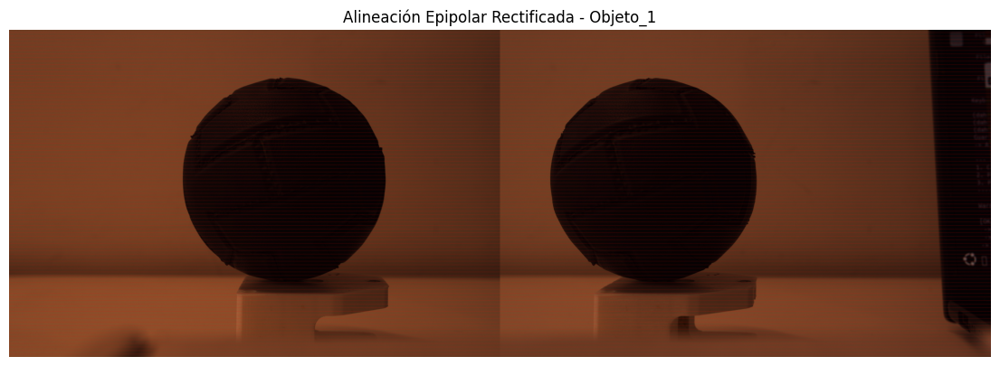


🔍 Procesando y verificando: Objeto_2...


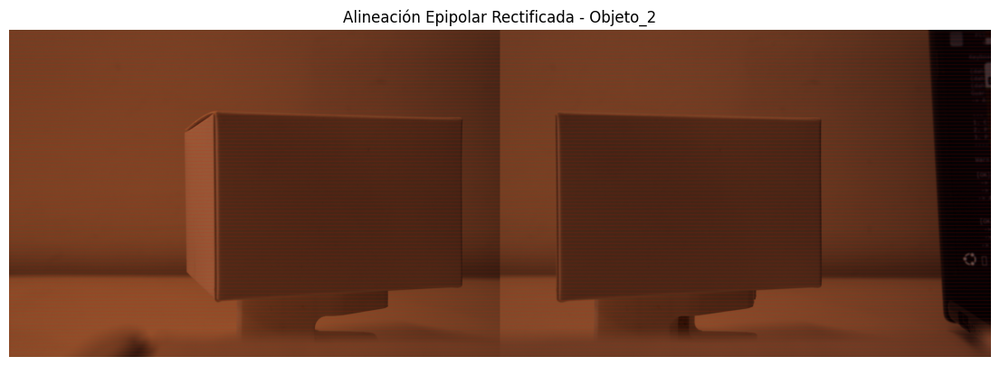


🔍 Procesando y verificando: Objeto_3...


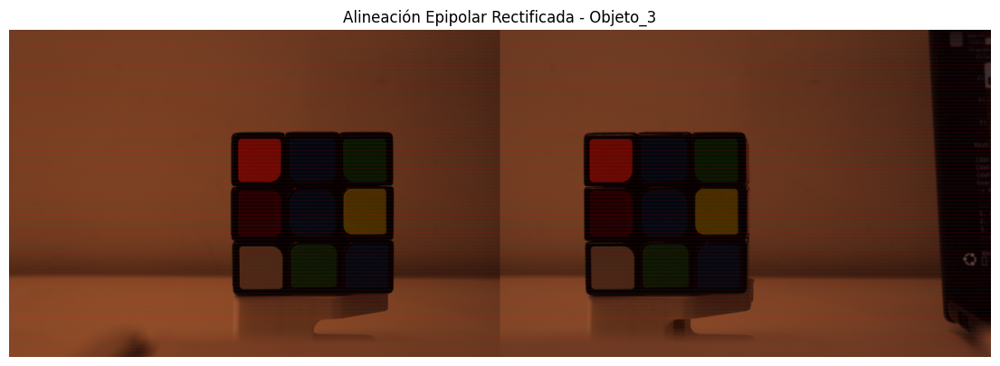


🎉 ¡Rectificación y verificación completadas! Guardado en:
 📂 /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Objetos_Rectificados


In [2]:
#!/usr/bin/env python
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# ==============================================================================
# PASO 0: MONTAJE DE GOOGLE DRIVE Y CONFIGURACIÓN DE RUTAS
# ==============================================================================
print("1. Conectando con Google Drive...")
drive.mount('/content/drive')

ROOT_DIR = "/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos"
CALIB_NPZ = os.path.join(ROOT_DIR, "CalibracionCamara", "Resultados", "parametros_calibracion_completa.npz")

if not os.path.exists(CALIB_NPZ):
    CALIB_NPZ = os.path.join(ROOT_DIR, "Resultados", "parametros_calibracion_completa.npz")

OBJETOS_DIR = os.path.join(ROOT_DIR, "Objetos")
RECT_DIR = os.path.join(ROOT_DIR, "Resultados", "Objetos_Rectificados")
os.makedirs(RECT_DIR, exist_ok=True)

# ==============================================================================
# PASO 1: CARGAR MATRICES Y CALCULAR RECTIFICACIÓN ESTÉREO
# ==============================================================================
print("2. Cargando parámetros de calibración...")
calib = np.load(CALIB_NPZ)
mtx_L, dist_L = calib['mtx_L'], calib['dist_L']
mtx_R, dist_R = calib['mtx_R'], calib['dist_R']
R, T, img_shape = calib['R'], calib['T'], tuple(calib['img_shape'])

# Obtener matrices de rotación de rectificación (R1, R2), proyección (P1, P2) y matriz Q
R1, R2, P1, P2, Q, roi_L, roi_R = cv2.stereoRectify(
    mtx_L, dist_L, mtx_R, dist_R, img_shape, R, T, alpha=0
)

# Guardar matrices en .npz (para uso por código en Bloques 3 y 4)
Q_npz_path = os.path.join(ROOT_DIR, "Resultados", "matriz_Q_rectificacion.npz")
np.savez(Q_npz_path, Q=Q, R1=R1, R2=R2, P1=P1, P2=P2)

# Guardar matrices en .txt (para inspección visual humana)
Q_txt_path = os.path.join(ROOT_DIR, "Resultados", "matriz_Q_rectificacion.txt")
with open(Q_txt_path, "w") as f:
    f.write("==================================================\n")
    f.write("     MATRIZ DE REPROYECCIÓN Q Y PARAMETROS DE RECTIFICACIÓN\n")
    f.write("==================================================\n\n")
    f.write("Matriz Q (Reproyección 3D):\n")
    np.savetxt(f, Q, fmt="%12.6f")
    f.write("\n\nMatriz R1 (Rotación Rectificación Izquierda):\n")
    np.savetxt(f, R1, fmt="%12.6f")
    f.write("\n\nMatriz R2 (Rotación Rectificación Derecha):\n")
    np.savetxt(f, R2, fmt="%12.6f")
    f.write("\n\nMatriz P1 (Proyección Izquierda):\n")
    np.savetxt(f, P1, fmt="%12.6f")
    f.write("\n\nMatriz P2 (Proyección Derecha):\n")
    np.savetxt(f, P2, fmt="%12.6f")

print(f" 💾 Matriz Q guardada en .npz: {Q_npz_path}")
print(f" 📄 Matriz Q guardada en .txt: {Q_txt_path}\n")

print("📋 Matriz Q obtenida:")
print(Q)
print("-" * 50)

# Generar mapas de transformación epipolar
map1_L, map2_L = cv2.initUndistortRectifyMap(mtx_L, dist_L, R1, P1, img_shape, cv2.CV_32FC1)
map1_R, map2_R = cv2.initUndistortRectifyMap(mtx_R, dist_R, R2, P2, img_shape, cv2.CV_32FC1)

# ==============================================================================
# PASO 2: RECTIFICACIÓN Y VERIFICACIÓN EPIPOLAR POR OBJETO
# ==============================================================================
objeto_folders = sorted(glob.glob(os.path.join(OBJETOS_DIR, "Objeto_*")))

if len(objeto_folders) == 0:
    raise RuntimeError(f"❌ No se encontraron carpetas dentro de: {OBJETOS_DIR}")

paso_lineas = 40  # Distancia en píxeles entre líneas guía rojas

for folder in objeto_folders:
    obj_name = os.path.basename(folder)
    print(f"\n🔍 Procesando y verificando: {obj_name}...")

    left_path = glob.glob(os.path.join(folder, "*left*.jpg")) + glob.glob(os.path.join(folder, "*left*.png"))
    right_path = glob.glob(os.path.join(folder, "*right*.jpg")) + glob.glob(os.path.join(folder, "*right*.png"))

    if not left_path or not right_path:
        print(f" ⚠️ No se encontraron las fotos del par en {folder}")
        continue

    img_L = cv2.imread(left_path[0])
    img_R = cv2.imread(right_path[0])

    # 1. Aplicar Rectificación
    rect_L = cv2.remap(img_L, map1_L, map2_L, cv2.INTER_LINEAR)
    rect_R = cv2.remap(img_R, map1_R, map2_R, cv2.INTER_LINEAR)

    # Carpetas de salida individual por objeto
    obj_output_dir = os.path.join(RECT_DIR, obj_name)
    os.makedirs(obj_output_dir, exist_ok=True)

    path_rect_L = os.path.join(obj_output_dir, f"{obj_name}_rect_izquierda.png")
    path_rect_R = os.path.join(obj_output_dir, f"{obj_name}_rect_derecha.png")

    cv2.imwrite(path_rect_L, rect_L)
    cv2.imwrite(path_rect_R, rect_R)

    # 2. Generar Verificación Epipolar (Líneas Horizontales)
    combo = np.hstack((rect_L, rect_R))
    h, w, _ = combo.shape

    for y in range(0, h, paso_lineas):
        cv2.line(combo, (0, y), (w, y), (0, 0, 255), 1)

    path_epi = os.path.join(obj_output_dir, f"{obj_name}_verificacion_epipolar.jpg")
    cv2.imwrite(path_epi, combo)

    # 3. Mostrar Resultado
    plt.figure(figsize=(14, 7))
    plt.imshow(cv2.cvtColor(combo, cv2.COLOR_BGR2RGB))
    plt.title(f"Alineación Epipolar Rectificada - {obj_name}", fontsize=12)
    plt.axis("off")
    plt.show()

print(f"\n🎉 ¡Rectificación y verificación completadas! Guardado en:\n 📂 {RECT_DIR}")

## **ETAPA 3: MAPAS DE DISPARIDAD**:

Los mapas de disparidad permiten estimar la profundidad de una escena a partir de dos imágenes rectificadas tomadas por cámaras alineadas en paralelo.

Independientemente del algoritmo que se utilice (métodos tradicionales como SGBM o redes neuronales como RAFT), el principio geométrico de triangulación es exactamente el mismo:

* **Disparidad ($d$):** Representa el desplazamiento horizontal (en píxeles) de un mismo punto visible en la imagen izquierda respecto a la derecha:
  $$d = x_{izq} - x_{der}$$

* **Profundidad Real ($Z$):** Relaciona la disparidad con la distancia física real perpendicular a la cámara mediante la fórmula:
  $$Z = \frac{f \cdot B}{d}$$

Donde:
* **$f$**: Distancia focal equivalente de los lentes (en píxeles).
* **$B$**: Línea base (*baseline*), correspondiente a la distancia física entre los centros ópticos de las dos cámaras (en mm).
* **$d$**: Disparidad medida (en píxeles).

### **Algoritmo StereoSGBM (*Semi-Global Block Matching*)**:

StereoSGBM es un algoritmo clásico de visión artificial diseñado para estimar la profundidad de una escena a partir de un par de imágenes rectificadas tomadas por cámaras paralelas.

---

**Funcionamiento del Algoritmo:**

1. **Búsqueda Unidimensional (1D):** Gracias a la rectificación previa, el punto correspondiente a un píxel de la cámara izquierda solo se busca a lo largo de la misma fila horizontal en la cámara derecha ($y_{izq} = y_{der}$).
2. **Comparación por Bloques (Vecindad):** Toma una ventana local de píxeles (`blockSize`) en la imagen izquierda y la desplaza horizontalmente sobre la imagen derecha para localizar la región de mayor similitud.
3. **Cálculo del Costo de Coincidencia:** Mide la diferencia de intensidad en escala de grises entre ambos bloques para evaluar el nivel de coincidencia.
4. **Optimización Semi-Global (SGM):** Para evitar que el ruido genere saltos abruptos de profundidad entre píxeles vecinos, analiza la coherencia espacial en múltiples direcciones (8 o 16 caminos) y penaliza las discontinuidades mediante dos parámetros:
   * **$P_1$:** Penaliza pequeños cambios de disparidad en superficies continuas y suaves.
   * **$P_2$:** Penaliza cambios bruscos de disparidad en bordes duros y contornos de los objetos.

---

### Pasos del Algoritmo en Código:

**1. Configuración e Inicialización del Estimador Estéreo**
Se definen el tamaño de ventana, el rango de disparidades y las constantes de penalización del modelo.
* `cv2.StereoSGBM_create()`: Instancia el objeto SGBM configurando parámetros como `numDisparities` (debe ser múltiplo de 16), `blockSize`, `P1`, `P2` y los filtros de limpieza de ruido (`speckleWindowSize` y `speckleRange`).

**2. Cálculo e Interpretación de Disparidad en Punto Fijo**
Calcula la correspondencia píxel a píxel operando sobre imágenes en escala de grises.
* `stereo.compute()`: Genera la matriz de disparidades en formato entero de punto fijo ($16\times$).
* **División entre $16.0$:** OpenCV entrega la disparidad multiplicada por 16 para mantener precisión subpíxel en enteros; por ello, se divide explícitamente entre `16.0` para convertir los valores a punto flotante (`np.float32`) reales.

**3. Mapeo y Normalización para Visualización Térmica**
Aisla únicamente los píxeles válidos dentro del rango de calibración para evitar falsas correspondencias.
* `cv2.applyColorMap()`: Transforma la disparidad normalizada de 8 bits a una paleta de falso color (`COLORMAP_JET`), donde el rojo indica máxima cercanía al sensor y el azul/negro representa zonas lejanas o no detectadas.

**4. Almacenamiento de Datos Múltiples**
Se guardan dos versiones de la información obtenida:
* `np.save()`: Exporta la matriz cruda sin normalizar (`disparidad_raw.npy`), reteniendo los valores métricos exactos en flotante necesarios para la reconstrucción 3D posterior.
* `cv2.imwrite()`: Guarda la imagen térmica visible (`.png`) para inspección y reporte.

1. Conectando con Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

🔍 Calculando disparidad real para: Objeto_1...


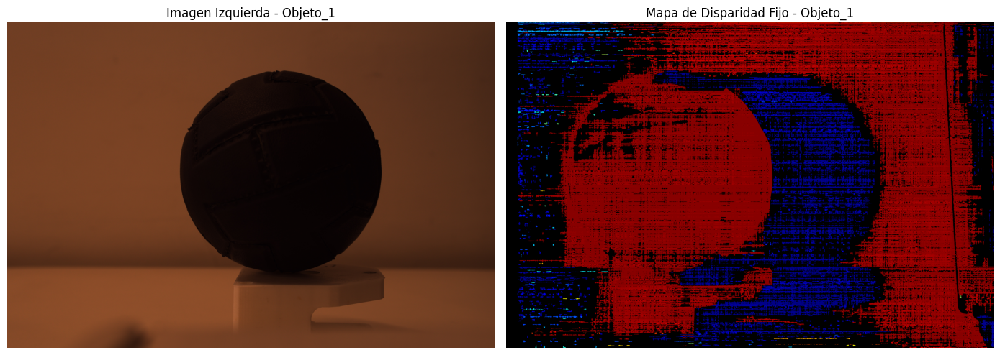


🔍 Calculando disparidad real para: Objeto_2...


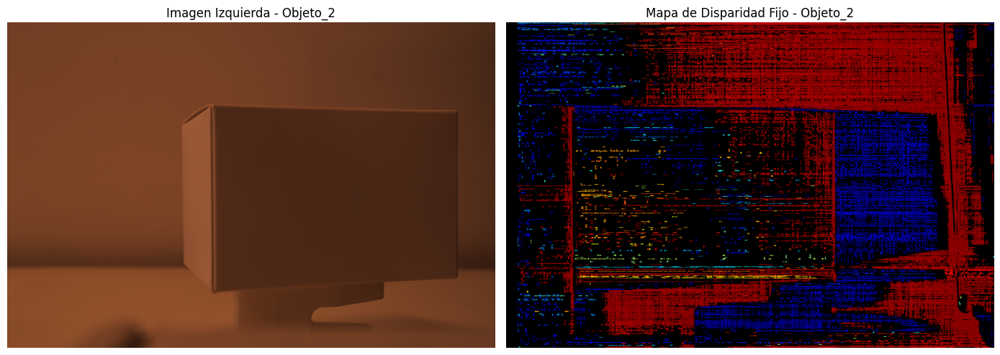


🔍 Calculando disparidad real para: Objeto_3...


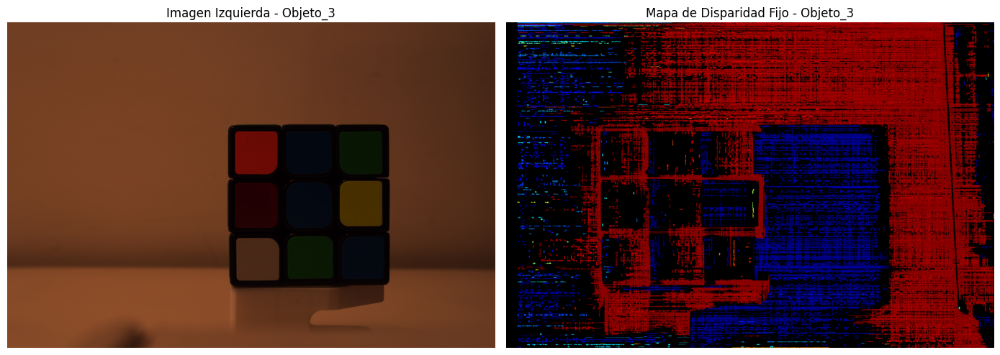


🎉 ¡Proceso completado!


In [3]:
#!/usr/bin/env python
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# ==============================================================================
# PASO 0: MONTAJE DE GOOGLE DRIVE Y RUTAS
# ==============================================================================
print("1. Conectando con Google Drive...")
drive.mount('/content/drive')

ROOT_DIR = "/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos"
RECT_DIR = os.path.join(ROOT_DIR, "Resultados", "Objetos_Rectificados")
DISP_DIR = os.path.join(ROOT_DIR, "Resultados", "Disparidad_Objetos")
os.makedirs(DISP_DIR, exist_ok=True)

# ==============================================================================
# PASO 1: CONFIGURAR STEREOSGBM CON RANGO FIJO
# ==============================================================================
block_size = 11      # Ventana más grande para capturar bordes de objetos lisos
min_disp = 0
num_disp = 16 * 8    # 128 niveles de disparidad

stereo = cv2.StereoSGBM_create(
    minDisparity=min_disp,
    numDisparities=num_disp,
    blockSize=block_size,
    P1=8 * 3 * block_size**2,
    P2=32 * 3 * block_size**2,
    disp12MaxDiff=2,
    uniquenessRatio=10,
    speckleWindowSize=200,  # Elimina manchas pequeñas de ruido en el fondo
    speckleRange=2,
    mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
)

# ==============================================================================
# PASO 2: PROCESAR CADA OBJETO
# ==============================================================================
objeto_folders = sorted(glob.glob(os.path.join(RECT_DIR, "Objeto_*")))

if len(objeto_folders) == 0:
    raise RuntimeError(f"❌ No se encontraron carpetas rectificadas en: {RECT_DIR}")

for folder in objeto_folders:
    obj_name = os.path.basename(folder)
    print(f"\n🔍 Calculando disparidad real para: {obj_name}...")

    left_path = glob.glob(os.path.join(folder, "*izquierda.png")) + glob.glob(os.path.join(folder, "*left.png"))
    right_path = glob.glob(os.path.join(folder, "*derecha.png")) + glob.glob(os.path.join(folder, "*right.png"))

    if not left_path or not right_path:
        continue

    img_L = cv2.imread(left_path[0])
    img_R = cv2.imread(right_path[0])

    gray_L = cv2.cvtColor(img_L, cv2.COLOR_BGR2GRAY)
    gray_R = cv2.cvtColor(img_R, cv2.COLOR_BGR2GRAY)

    # Cálculo directo de disparidad SGBM
    disp_int = stereo.compute(gray_L, gray_R)
    raw_disparity = disp_int.astype(np.float32) / 16.0

    # Máscara de validación (Solo conservar disparidades dentro del rango calibrado)
    valid_mask = (raw_disparity > min_disp) & (raw_disparity < (min_disp + num_disp))

    # Mapeo Absoluto de Profundidad (Evita la inversión cromática)
    # 0 = Distancia lejana / sin datos (Negro/Azul) | 255 = Muy cerca (Rojo)
    disp_scaled = np.zeros_like(raw_disparity, dtype=np.float32)
    disp_scaled[valid_mask] = ((raw_disparity[valid_mask] - min_disp) / num_disp) * 255.0
    disp_uint8 = np.clip(disp_scaled, 0, 255).astype(np.uint8)

    # Aplicar mapa de calor JET únicamente a las regiones válidas
    disp_color = cv2.applyColorMap(disp_uint8, cv2.COLORMAP_JET)
    disp_color[~valid_mask] = [0, 0, 0]  # Píxeles sin datos a negro absoluto

    # Guardado de archivos
    obj_out_dir = os.path.join(DISP_DIR, obj_name)
    os.makedirs(obj_out_dir, exist_ok=True)

    np.save(os.path.join(obj_out_dir, "disparidad_raw.npy"), raw_disparity)
    cv2.imwrite(os.path.join(obj_out_dir, f"{obj_name}_disparidad_vis.png"), disp_color)

    # Visualización
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    axes[0].imshow(cv2.cvtColor(img_L, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Imagen Izquierda - {obj_name}")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(disp_color, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Mapa de Disparidad Fijo - {obj_name}")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

print(f"\n🎉 ¡Proceso completado!")

### **Algoritmo RAFT-Stereo (*Recurrent All-Pairs Field Transforms*):**

RAFT-Stereo es un algoritmo basado en redes neuronales profundas (*Deep Learning*) diseñado originalmente para flujo óptico y adaptado a visión estéreo. A diferencia de los métodos tradicionales por bloques (como SGBM), RAFT aprovecha la comprensión semántica y contextual de la escena para inferir profundidad con alta resolución incluso en zonas reflexivas, con sombras o sin textura.

---

**Funcionamiento del Algoritmo:**

1. **Extracción de Características Profundas:** Redes convolucionales (CNN) procesan ambas imágenes por separado para extraer mapas de características a múltiples escalas, codificando tanto detalles locales como contexto semántico.
2. **Volumen de Correlación Global:** Construye un volumen de correlación de todos contra todos (*All-Pairs Correlation Volume*), midiendo la similitud entre cada píxel de la imagen izquierda y todos los píxeles potenciales de la imagen derecha.
3. **Refinamiento Recurrente mediante GRU:** En lugar de estimar la disparidad en un solo paso, utiliza un bloque recurrente basado en celdas GRU (*Gated Recurrent Unit*). Este bloque actualiza e incrementa iterativamente la precisión de la disparidad paso a paso.
4. **Continuidad y Relleno Estructurado:** Gracias al aprendizaje profundo, el modelo infiere la geometría tridimensional de objetos completos, rellenando con precisión zonas planas, lisas o sin textura donde los métodos tradicionales suelen fallar.

---

**Pasos y Funciones Clave del Código:**

1. **Carga y Preparación del Modelo Profundo**
   * `Raft_Large_Weights.DEFAULT` y `raft_large()`: Carga los pesos preentrenados de la arquitectura RAFT de alta capacidad desde `torchvision`.
   * `weights.transforms()`: Aplica la normalización requerida por la red neuronal a los tensores de entrada.

2. **Acondicionamiento Geométrico de Entrada**
   * `cv2.resize()` (pre-inferencia): Ajusta el tamaño de la imagen a una escala segura para prevenir desbordamientos de memoria en la GPU (VRAM).
   * `F_torch.pad()`: Aplica relleno (*padding*) en los bordes para garantizar que las dimensiones de alto y ancho de la imagen sean múltiplos de 8, requisito estructural de las capas de convolución y *downsampling*.

3. **Inferencia Recurrente en GPU**
   * `torch.no_grad()`: Desactiva el cálculo de gradientes para acelerar la ejecución y reducir el consumo de memoria durante la inferencia.
   * `model(img1, img2)`: Ejecuta la red y devuelve una lista con las estimaciones de flujo de cada iteración recurrente.
   * `list_of_flows[-1]`: Extrae la última estimación del ciclo GRU, correspondiente al mapa de flujo más refinado y preciso.
   * `flow[0, 0]`: Selecciona el componente horizontal del flujo óptico en $X$, el cual equivale geométricamente a la **disparidad**.

4. **Escalado Múltiple y Corrección de Magnitud**
   * `cv2.resize() / scale` (post-inferencia): Re escala la matriz de disparidad a las dimensiones originales de la foto y divide el resultado por el factor `scale` para corregir la magnitud del desplazamiento en píxeles reales.

5. **Visualización y Persistencia de Datos**
   * `np.save()`: Guarda el arreglo matricial flotante crudo (`disparidad_raw_dp.npy`) indispensable para la reconstrucción 3D.
   * `cv2.normalize()` y `cv2.applyColorMap()`: Escala el resultado de 0 a 255 y le aplica el mapa térmico `COLORMAP_JET` para inspección visual.
   * `torch.cuda.empty_cache()`: Libera la memoria caché de la tarjeta gráfica al finalizar cada objeto.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
⚡ Ejecutando Deep Learning en: CPU

🧠 Inferencia Deep Learning (RAFT) para: Objeto_1...
  💾 Mapa de disparidad guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/MapasDisparidadDP/Objeto_1/disparidad_raw_dp.npy


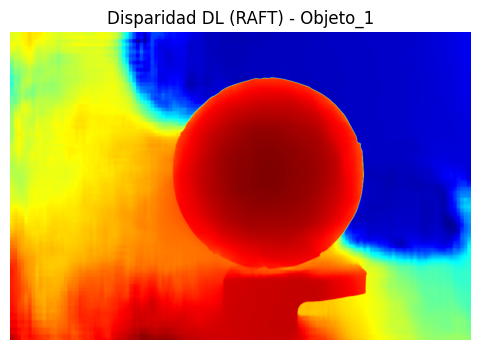


🧠 Inferencia Deep Learning (RAFT) para: Objeto_2...
  💾 Mapa de disparidad guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/MapasDisparidadDP/Objeto_2/disparidad_raw_dp.npy


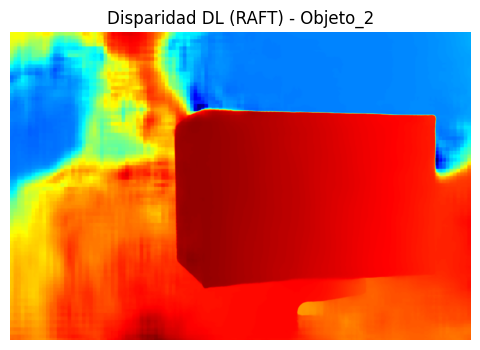


🧠 Inferencia Deep Learning (RAFT) para: Objeto_3...
  💾 Mapa de disparidad guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/MapasDisparidadDP/Objeto_3/disparidad_raw_dp.npy


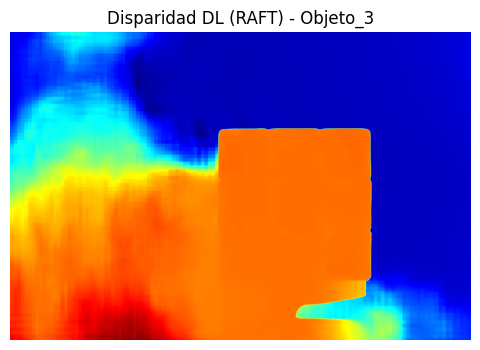


🎉 ¡Mapas de disparidad con Deep Learning generados con éxito!


In [4]:
#!/usr/bin/env python
import os
import glob
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F_torch
from torchvision.models.optical_flow import raft_large, Raft_Large_Weights
from google.colab import drive

# ==============================================================================
# PASO 0: MONTAJE Y RUTAS
# ==============================================================================
drive.mount('/content/drive')

ROOT_DIR = "/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos"
RECT_DIR = os.path.join(ROOT_DIR, "Resultados", "Objetos_Rectificados")
DISP_DP_DIR = os.path.join(ROOT_DIR, "Resultados", "MapasDisparidadDP")

os.makedirs(DISP_DP_DIR, exist_ok=True)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"⚡ Ejecutando Deep Learning en: {device.upper()}")

# ==============================================================================
# PASO 1: CARGAR MODELO RAFT
# ==============================================================================
weights = Raft_Large_Weights.DEFAULT
transforms = weights.transforms()
model = raft_large(weights=weights, progress=False).to(device)
model.eval()

# ==============================================================================
# PASO 2: INFERENCIA CON CONTROL DE MEMORIA VRAM
# ==============================================================================
objeto_folders = sorted(glob.glob(os.path.join(RECT_DIR, "Objeto_*")))

for folder in objeto_folders:
    obj_name = os.path.basename(folder)
    print(f"\n🧠 Inferencia Deep Learning (RAFT) para: {obj_name}...")

    img_L_path = glob.glob(os.path.join(folder, "*izquierda.png")) or glob.glob(os.path.join(folder, "*left.png"))
    img_R_path = glob.glob(os.path.join(folder, "*derecha.png")) or glob.glob(os.path.join(folder, "*right.png"))

    if not img_L_path or not img_R_path:
        print(f"⚠️ No se encontraron imágenes estéreo en {folder}")
        continue

    img_L = cv2.imread(img_L_path[0])
    img_R = cv2.imread(img_R_path[0])
    h_orig, w_orig = img_L.shape[:2]

    # Redimensionar para mantener el uso de memoria bajo control (máximo 1024px)
    max_dim = 1024
    scale = min(max_dim / h_orig, max_dim / w_orig) if max(h_orig, w_orig) > max_dim else 1.0

    if scale < 1.0:
        new_w = int(w_orig * scale)
        new_h = int(h_orig * scale)
        img_L_in = cv2.resize(img_L, (new_w, new_h), interpolation=cv2.INTER_AREA)
        img_R_in = cv2.resize(img_R, (new_w, new_h), interpolation=cv2.INTER_AREA)
    else:
        img_L_in, img_R_in = img_L, img_R

    # Convertir a tensores torch (C, H, W)
    tensor_L = torch.from_numpy(cv2.cvtColor(img_L_in, cv2.COLOR_BGR2RGB)).permute(2, 0, 1)
    tensor_R = torch.from_numpy(cv2.cvtColor(img_R_in, cv2.COLOR_BGR2RGB)).permute(2, 0, 1)

    img1, img2 = transforms(tensor_L, tensor_R)
    img1 = img1.unsqueeze(0).to(device)
    img2 = img2.unsqueeze(0).to(device)

    # Padding para asegurar dimensiones divisibles por 8
    h, w = img1.shape[2], img1.shape[3]
    pad_h = (8 - h % 8) % 8
    pad_w = (8 - w % 8) % 8

    if pad_h > 0 or pad_w > 0:
        img1 = F_torch.pad(img1, (0, pad_w, 0, pad_h), mode='replicate')
        img2 = F_torch.pad(img2, (0, pad_w, 0, pad_h), mode='replicate')

    # Inferencia en GPU
    with torch.no_grad():
        list_of_flows = model(img1, img2)
        flow = list_of_flows[-1]

    if pad_h > 0 or pad_w > 0:
        flow = flow[:, :, :h, :w]

    disp_low_res = np.abs(flow[0, 0].cpu().numpy())

    # Reescalar la disparidad a las dimensiones originales para acoplar con Q
    if scale < 1.0:
        disparity_dp = cv2.resize(disp_low_res, (w_orig, h_orig), interpolation=cv2.INTER_LINEAR) / scale
    else:
        disparity_dp = disp_low_res

    # Guardar resultados
    out_obj_dir = os.path.join(DISP_DP_DIR, obj_name)
    os.makedirs(out_obj_dir, exist_ok=True)

    npy_path = os.path.join(out_obj_dir, "disparidad_raw_dp.npy")
    np.save(npy_path, disparity_dp)

    disp_vis = cv2.normalize(disparity_dp, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    disp_color = cv2.applyColorMap(disp_vis, cv2.COLORMAP_JET)
    cv2.imwrite(os.path.join(out_obj_dir, "disparidad_vis_dp.png"), disp_color)

    print(f"  💾 Mapa de disparidad guardado: {npy_path}")

    # Vista previa del mapa generado
    plt.figure(figsize=(7, 4))
    plt.imshow(cv2.cvtColor(disp_color, cv2.COLOR_BGR2RGB))
    plt.title(f"Disparidad DL (RAFT) - {obj_name}")
    plt.axis('off')
    plt.show()

    # Limpiar caché de memoria en PyTorch tras cada objeto
    torch.cuda.empty_cache()

print("\n🎉 ¡Mapas de disparidad con Deep Learning generados con éxito!")

## **ETAPA 4: RECONSTRUCCIÓN ESTÉREO 3D**:

La reconstrucción 3D es la etapa final de la geometría estéreo. En este paso se convierte la información 2D del mapa de disparidad ($d$) en coordenadas tridimensionales métricas reales $(X, Y, Z)$ para cada píxel de la imagen.

---

### Matriz de Reproyección $Q$

Para transformar las coordenadas de la imagen a coordenadas del mundo real se utiliza la matriz de reproyección tridimensional $Q$, obtenida durante la etapa de rectificación estéreo mediante los parámetros intrínsecos de las cámaras y la línea base ($B$).

El cálculo homogéneo que realiza el sistema es:

$$\begin{bmatrix} X \\ Y \\ Z \\ W \end{bmatrix} = Q \cdot \begin{bmatrix} u \\ v \\ d(u,v) \\ 1 \end{bmatrix}$$

Las coordenadas 3D métricas reales se obtienen dividiendo entre el factor de escala $W$:

$$(X_{3D}, Y_{3D}, Z_{3D}) = \left( \frac{X}{W}, \frac{Y}{W}, \frac{Z}{W} \right)$$

---

### Flujo de Procesamiento y Funciones Clave del Código

Ambos enfoques (SGBM y RAFT) comparten la misma tubería de procesamiento 3D implementada mediante las siguientes funciones clave:

1. **Reproyección Tridimensional:**
   * `cv2.reprojectImageTo3D(disparity, Q)`: Mapea cada píxel $(u,v)$ con su disparidad $d$ a su correspondiente punto tridimensional $(X,Y,Z)$ expresado en milímetros.
   * `np.isfinite(...)`: Filtra puntos inválidos donde la disparidad es nula o produce divisiones por cero ($Z = \infty$).

2. **Delimitación del Espacio de Interés (Bounding Box / Percentiles):**
   * *En SGBM:* Aplica una caja delimitadora con cortes fijos en $X, Y, Z$ para eliminar el ruido de fondo debido a las inconsistencias del algoritmo por bloques.
   * *En RAFT:* Utiliza percentiles dinámicos (`np.percentile`) sobre el eje $Z$ ($Z_{min}$ al 2% y $Z_{max}$ al 85%) para aislar automáticamente el objeto del fondo sin perder la densidad continua que ofrece el modelo profundo.

3. **Filtrado Estadístico de Outliers (SOR):**
   * `cKDTree(points)` y `tree.query()`: Construye una estructura de datos espacial tipo KD-Tree para calcular la distancia media de cada punto hacia sus $k$ vecinos más cercanos.
   * `filtrar_outliers_estadisticos()`: Descarta puntos aislados ("flotantes") cuya distancia promedio supera el umbral estadístico de la escena ($\mu + \text{std\_ratio} \cdot \sigma$).

4. **Exportación y Visualización Interactiva:**
   * `guardar_ply()`: Exporta la nube de puntos procesada en formato ASCII `.ply` con coordenadas $(X,Y,Z)$ y color $RGB$ de la foto original para su inspección en software externo como MeshLab o CloudCompare.
   * `go.Scatter3d()` y `pio.write_html()`: Renderiza la nube de puntos en un visor 3D interactivo e independiente dentro de Google Colab mediante Plotly.

### **Algoritmo StereoSGBM (*Semi-Global Block Matching*)**:

In [2]:
#!/usr/bin/env python
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
import plotly.graph_objects as go
import plotly.io as pio
from google.colab import drive

# ==============================================================================
# PASO 0: MONTAJE DE GOOGLE DRIVE Y RUTAS
# ==============================================================================
drive.mount('/content/drive')

ROOT_DIR = "/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos"
RECT_DIR = os.path.join(ROOT_DIR, "Resultados", "Objetos_Rectificados")
DISP_DIR = os.path.join(ROOT_DIR, "Resultados", "Disparidad_Objetos")
CLOUD_DIR = os.path.join(ROOT_DIR, "Resultados", "Nubes_de_Puntos_3D")
CALIB_FILE = os.path.join(ROOT_DIR, "Resultados", "matriz_Q_rectificacion.npz")

os.makedirs(CLOUD_DIR, exist_ok=True)

# ==============================================================================
# FUNCIONES AUXILIAR DE FILTRADO Y GUARDADO
# ==============================================================================
def filtrar_outliers_estadisticos(points, colors, k_vecinos=25, std_ratio=1.2):
    """Elimina motas aisladas calculando la distancia media a sus vecinos mas cercanos."""
    if len(points) < k_vecinos:
        return points, colors

    tree = cKDTree(points)
    distances, _ = tree.query(points, k=k_vecinos + 1)

    mean_distances = np.mean(distances[:, 1:], axis=1)
    mu = np.mean(mean_distances)
    sigma = np.std(mean_distances)
    threshold = mu + std_ratio * sigma

    inliers_mask = mean_distances < threshold
    return points[inliers_mask], colors[inliers_mask]

def guardar_ply(filename, points, colors):
    points = points.reshape(-1, 3)
    colors = colors.reshape(-1, 3)
    vertices = np.hstack([points, colors])

    header = f"""ply
format ascii 1.0
element vertex {len(vertices)}
property float x
property float y
property float z
property uchar red
property uchar green
property uchar blue
end_header
"""
    with open(filename, 'w') as f:
        f.write(header)
        np.savetxt(f, vertices, fmt="%f %f %f %d %d %d")

# ==============================================================================
# PASO 1: CARGAR MATRIZ Q
# ==============================================================================
if not os.path.exists(CALIB_FILE):
    raise FileNotFoundError(f"❌ No se encontró el archivo en: {CALIB_FILE}")

calib_data = np.load(CALIB_FILE)
if 'Q' in calib_data:
    Q = calib_data['Q']
elif 'matriz_Q' in calib_data:
    Q = calib_data['matriz_Q']
else:
    Q = calib_data[calib_data.files[0]]

print(f"✅ Matriz Q cargada con éxito desde '{CALIB_FILE}'.")

# ==============================================================================
# PASO 2: PROCESAMIENTO EN BUCLE PARA LOS 3 OBJETOS
# ==============================================================================
objeto_folders = sorted(glob.glob(os.path.join(DISP_DIR, "Objeto_*")))

for folder in objeto_folders:
    obj_name = os.path.basename(folder)
    print(f"\n==================================================")
    print(f"🧱 Procesando reconstrucción 3D para: {obj_name}")
    print(f"==================================================")

    disp_file = os.path.join(folder, "disparidad_raw.npy")
    img_files = glob.glob(os.path.join(RECT_DIR, obj_name, "*izquierda.png")) + \
                glob.glob(os.path.join(RECT_DIR, obj_name, "*left.png"))

    if not os.path.exists(disp_file) or not img_files:
        print(f"⚠️ Faltan datos para {obj_name}, se omitirá.")
        continue

    disparity = np.load(disp_file)
    img_L = cv2.imread(img_files[0])
    img_RGB = cv2.cvtColor(img_L, cv2.COLOR_BGR2RGB)

    # 1. Reproyección 3D
    points_3d = cv2.reprojectImageTo3D(disparity, Q)

    # 2. Máscara de disparidades válidas
    valid_mask = (disparity > 0) & np.isfinite(points_3d).all(axis=2)
    pts = points_3d[valid_mask]
    cols = img_RGB[valid_mask]

    # Ajustar signo Z para orientación frontal positiva
    pts[:, 2] = np.abs(pts[:, 2])

    # 3. Filtro 1: Caja Delimitadora Espacial (Bounding Box)
    x_mask = (pts[:, 0] > -1200) & (pts[:, 0] < 1200)
    y_mask = (pts[:, 1] > -1000) & (pts[:, 1] < 1000)
    z_mask = (pts[:, 2] > 1000)  & (pts[:, 2] < 4500)

    box_mask = x_mask & y_mask & z_mask
    pts_box = pts[box_mask]
    cols_box = cols[box_mask]

    print(f"  🔍 Puntos tras delimitación de espacio: {len(pts_box)}")

    # 4. Filtro 2: Outliers Estadísticos (SOR)
    pts_clean, cols_clean = filtrar_outliers_estadisticos(
        pts_box, cols_box, k_vecinos=25, std_ratio=1.2
    )
    print(f"  ✅ Puntos finales limpios: {len(pts_clean)}")

    if len(pts_clean) == 0:
        print("  ⚠️ No quedaron puntos tras aplicar los filtros.")
        continue

    # 5. Guardar modelo .PLY
    ply_filename = os.path.join(CLOUD_DIR, f"{obj_name}_nube3D_limpia.ply")
    guardar_ply(ply_filename, pts_clean, cols_clean)
    print(f"  💾 Archivo .PLY guardado: {ply_filename}")

    # 6. Crear gráfica interactiva con Plotly
    step = max(1, len(pts_clean) // 12000)
    p_sub = pts_clean[::step]
    c_sub = cols_clean[::step]

    color_strings = [f'rgb({r},{g},{b})' for r, g, b in c_sub]

    fig = go.Figure(data=[go.Scatter3d(
        x=p_sub[:, 0],
        y=p_sub[:, 1],
        z=p_sub[:, 2],
        mode='markers',
        marker=dict(
            size=4,  # Puntos más gruesos para dar sensación de superficie sólida
            color=color_strings,
            opacity=0.9
        )
    )])

    fig.update_layout(
        template="plotly_dark",
        title=f"Reconstrucción 3D Interactiva - {obj_name}",
        scene=dict(
            xaxis_title='X (mm)',
            yaxis_title='Y (mm)',
            zaxis_title='Z (mm)',
            aspectmode='data'
        ),
        margin=dict(r=0, l=0, b=0, t=40)
    )

    # 7. Exportar visor HTML autónomo
    html_filename = os.path.join(CLOUD_DIR, f"{obj_name}_visor3D.html")
    pio.write_html(fig, file=html_filename, auto_open=False)
    print(f"  🌐 Visor HTML interactivo exportado: {html_filename}")

    # Muestra el visor 3D interactivo en la consola de Colab
    fig.show()

print("\n🎉 ¡Procesamiento completado para los 3 objetos!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Matriz Q cargada con éxito desde '/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/matriz_Q_rectificacion.npz'.

🧱 Procesando reconstrucción 3D para: Objeto_1
  🔍 Puntos tras delimitación de espacio: 8910709
  ✅ Puntos finales limpios: 8073083
  💾 Archivo .PLY guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Nubes_de_Puntos_3D/Objeto_1_nube3D_limpia.ply
  🌐 Visor HTML interactivo exportado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Nubes_de_Puntos_3D/Objeto_1_visor3D.html



🧱 Procesando reconstrucción 3D para: Objeto_2
  🔍 Puntos tras delimitación de espacio: 5125522
  ✅ Puntos finales limpios: 4673762
  💾 Archivo .PLY guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Nubes_de_Puntos_3D/Objeto_2_nube3D_limpia.ply
  🌐 Visor HTML interactivo exportado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Nubes_de_Puntos_3D/Objeto_2_visor3D.html



🧱 Procesando reconstrucción 3D para: Objeto_3
  🔍 Puntos tras delimitación de espacio: 6697790
  ✅ Puntos finales limpios: 6091381
  💾 Archivo .PLY guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Nubes_de_Puntos_3D/Objeto_3_nube3D_limpia.ply
  🌐 Visor HTML interactivo exportado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Nubes_de_Puntos_3D/Objeto_3_visor3D.html



🎉 ¡Procesamiento completado para los 3 objetos!


### **Algoritmo RAFT-Stereo (*Recurrent All-Pairs Field Transforms*):**

In [1]:
#!/usr/bin/env python
import os
import glob
import cv2
import numpy as np
from scipy.spatial import cKDTree
import plotly.graph_objects as go
import plotly.io as pio
from google.colab import drive

# ==============================================================================
# PASO 0: MONTAJE DE GOOGLE DRIVE Y RUTAS
# ==============================================================================
drive.mount('/content/drive')

ROOT_DIR = "/content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos"
RECT_DIR = os.path.join(ROOT_DIR, "Resultados", "Objetos_Rectificados")
DISP_DP_DIR = os.path.join(ROOT_DIR, "Resultados", "MapasDisparidadDP")
RECONS_DP_DIR = os.path.join(ROOT_DIR, "Resultados", "Reconstruccion3D_DP")
CALIB_FILE = os.path.join(ROOT_DIR, "Resultados", "matriz_Q_rectificacion.npz")

os.makedirs(RECONS_DP_DIR, exist_ok=True)

# ==============================================================================
# FUNCIONES AUXILIARES
# ==============================================================================
def filtrar_outliers_estadisticos(points, colors, k_vecinos=25, std_ratio=1.5):
    if len(points) < k_vecinos:
        return points, colors
    tree = cKDTree(points)
    distances, _ = tree.query(points, k=k_vecinos + 1)
    mean_dists = np.mean(distances[:, 1:], axis=1)
    threshold = np.mean(mean_dists) + std_ratio * np.std(mean_dists)
    inliers_mask = mean_dists < threshold
    return points[inliers_mask], colors[inliers_mask]

def guardar_ply(filename, points, colors):
    vertices = np.hstack([points.reshape(-1, 3), colors.reshape(-1, 3)])
    header = f"""ply
format ascii 1.0
element vertex {len(vertices)}
property float x
property float y
property float z
property uchar red
property uchar green
property uchar blue
end_header
"""
    with open(filename, 'w') as f:
        f.write(header)
        np.savetxt(f, vertices, fmt="%f %f %f %d %d %d")

# ==============================================================================
# PASO 1: CARGAR MATRIZ Q
# ==============================================================================
calib_data = np.load(CALIB_FILE)
Q = calib_data['Q'] if 'Q' in calib_data else calib_data[calib_data.files[0]]

# ==============================================================================
# PASO 2: RECONSTRUCCIÓN CON RANGOS ADAPTATIVOS
# ==============================================================================
objeto_folders = sorted(glob.glob(os.path.join(DISP_DP_DIR, "Objeto_*")))

for folder in objeto_folders:
    obj_name = os.path.basename(folder)
    print(f"\n==================================================")
    print(f"🧱 Reconstruyendo modelo 3D DL para: {obj_name}")
    print(f"==================================================")

    disp_file = os.path.join(folder, "disparidad_raw_dp.npy")
    img_files = glob.glob(os.path.join(RECT_DIR, obj_name, "*izquierda.png")) + \
                glob.glob(os.path.join(RECT_DIR, obj_name, "*left.png"))

    if not os.path.exists(disp_file) or not img_files:
        print(f"⚠️ Faltan datos para {obj_name}, se omitirá.")
        continue

    disparity_dp = np.load(disp_file)
    img_RGB = cv2.cvtColor(cv2.imread(img_files[0]), cv2.COLOR_BGR2RGB)

    # 1. Reproyección 3D
    points_3d = cv2.reprojectImageTo3D(disparity_dp, Q)

    # 2. Máscara de puntos válidos (disparidad mínima para evitar Z = infinito)
    valid_mask = (disparity_dp > 0.5) & np.isfinite(points_3d).all(axis=2)
    pts = points_3d[valid_mask]
    cols = img_RGB[valid_mask]
    pts[:, 2] = np.abs(pts[:, 2])

    print(f"  📊 Puntos iniciales válidos: {len(pts)}")
    if len(pts) == 0:
        continue

    print(f"  📊 Rango Z detectado: min = {pts[:, 2].min():.1f} mm | max = {pts[:, 2].max():.1f} mm")

    # 3. Delimitación espacial ampliada para asegurar captura
    # Filtra profundidades extremas usando percentiles para aislar el objeto del fondo
    z_min = np.percentile(pts[:, 2], 2)   # Descarta valores pegados al lente
    z_max = np.percentile(pts[:, 2], 85)  # Descarta la pared de fondo

    box_mask = (pts[:, 0] > -2000) & (pts[:, 0] < 2000) & \
               (pts[:, 1] > -1500) & (pts[:, 1] < 1500) & \
               (pts[:, 2] >= z_min) & (pts[:, 2] <= z_max)

    pts_box = pts[box_mask]
    cols_box = cols[box_mask]
    print(f"  🔍 Puntos tras delimitación de caja adaptativa: {len(pts_box)}")

    # 4. Outliers Estadísticos (SOR)
    pts_clean, cols_clean = filtrar_outliers_estadisticos(pts_box, cols_box, k_vecinos=30, std_ratio=1.5)
    print(f"  ✅ Puntos finales limpios: {len(pts_clean)}")

    if len(pts_clean) == 0:
        print("  ⚠️ Ajusta los límites de la caja según los rangos impresos arriba.")
        continue

    # 5. Exportar .PLY
    ply_path = os.path.join(RECONS_DP_DIR, f"{obj_name}_nube3D_DP.ply")
    guardar_ply(ply_path, pts_clean, cols_clean)
    print(f"  💾 Archivo .PLY guardado: {ply_path}")

    # 6. Generar visor HTML interactivo
    step = max(1, len(pts_clean) // 15000)
    p_sub, c_sub = pts_clean[::step], cols_clean[::step]
    color_strings = [f'rgb({r},{g},{b})' for r, g, b in c_sub]

    fig = go.Figure(data=[go.Scatter3d(
        x=p_sub[:, 0], y=p_sub[:, 1], z=p_sub[:, 2],
        mode='markers',
        marker=dict(size=3, color=color_strings, opacity=0.9)
    )])

    fig.update_layout(
        template="plotly_dark",
        title=f"Reconstrucción 3D Deep Learning - {obj_name}",
        scene=dict(xaxis_title='X (mm)', yaxis_title='Y (mm)', zaxis_title='Z (mm)', aspectmode='data'),
        margin=dict(r=0, l=0, b=0, t=40)
    )

    html_path = os.path.join(RECONS_DP_DIR, f"{obj_name}_visor3D_DP.html")
    pio.write_html(fig, file=html_path, auto_open=False)
    print(f"  🌐 Visor HTML guardado: {html_path}")
    fig.show()

print("\n🎉 ¡Reconstrucción 3D con Deep Learning completada!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

🧱 Reconstruyendo modelo 3D DL para: Objeto_1
  📊 Puntos iniciales válidos: 20181312
  📊 Rango Z detectado: min = 210.5 mm | max = 577.4 mm
  🔍 Puntos tras delimitación de caja adaptativa: 16750496
  ✅ Puntos finales limpios: 16141051
  💾 Archivo .PLY guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Reconstruccion3D_DP/Objeto_1_nube3D_DP.ply
  🌐 Visor HTML guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Reconstruccion3D_DP/Objeto_1_visor3D_DP.html



🧱 Reconstruyendo modelo 3D DL para: Objeto_2
  📊 Puntos iniciales válidos: 20181312
  📊 Rango Z detectado: min = 196.5 mm | max = 1164.7 mm
  🔍 Puntos tras delimitación de caja adaptativa: 16750509
  ✅ Puntos finales limpios: 15983938
  💾 Archivo .PLY guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Reconstruccion3D_DP/Objeto_2_nube3D_DP.ply
  🌐 Visor HTML guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Reconstruccion3D_DP/Objeto_2_visor3D_DP.html



🧱 Reconstruyendo modelo 3D DL para: Objeto_3
  📊 Puntos iniciales válidos: 20181312
  📊 Rango Z detectado: min = 179.3 mm | max = 591.0 mm
  🔍 Puntos tras delimitación de caja adaptativa: 16750516
  ✅ Puntos finales limpios: 16042743
  💾 Archivo .PLY guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Reconstruccion3D_DP/Objeto_3_nube3D_DP.ply
  🌐 Visor HTML guardado: /content/drive/MyDrive/VisionArtificial/CalibracionCamara_CorrecionObjetos/Resultados/Reconstruccion3D_DP/Objeto_3_visor3D_DP.html



🎉 ¡Reconstrucción 3D con Deep Learning completada!


### Comparativa: Reconstrucción SGBM vs. RAFT (Deep Learning)

* **SGBM:** Produce nubes de puntos más dispersas y con vacíos en zonas lisas debido a los errores de coincidencia por bloques. Requiere un filtrado espacial estricto para remover ruido flotante.
* **RAFT (DL):** Genera nubes de puntos densas, continuas y detalladas que conservan fielmente la estructura geométrica del objeto reconstruido, reduciendo la pérdida de información en superficies planas.